In [8]:
import pandas as pd
pd.set_option('display.max_rows',10)
pd.set_option('display.max_columns',70)

import plotly.offline as py
import plotly.graph_objs as go
py.init_notebook_mode()

import numpy as np
np.random.seed(42)

from fbprophet import Prophet

In [10]:
%time df_transcations = pd.read_csv('/Users/pliu/Downloads/prophet/transactions.csv')
%time df_holidays_events = pd.read_csv('/Users/pliu/Downloads/prophet/holidays_events.csv')

CPU times: user 42.5 ms, sys: 27.3 ms, total: 69.8 ms
Wall time: 79 ms
CPU times: user 6.72 ms, sys: 1.52 ms, total: 8.24 ms
Wall time: 9.03 ms


In [11]:
df_transcations.shape, df_holidays_events.shape

((83488, 3), (350, 6))

In [12]:
df_transcations.head()

,date,store_nbr,transactions
0,2013-01-01,25,770
1,2013-01-02,1,2111
2,2013-01-02,2,2358
3,2013-01-02,3,3487
4,2013-01-02,4,1922


In [19]:
transcations = df_transcations.groupby('date')['transactions'].sum()
transcations.head()

date
2013-01-01      770
2013-01-02    93215
2013-01-03    78504
2013-01-04    78494
2013-01-05    93573
Name: transactions, dtype: int64

In [14]:
py.iplot([go.Scatter(x=transcations.index, y=transcations)])
# sales data from 2013 to 2017
# strong seasonality and holiday effect

In [21]:
# FB Prophet
transcations = pd.DataFrame(transcations).reset_index()
transcations.columns = ['ds', 'y']
transcations

,ds,y
0,2013-01-01,770
1,2013-01-02,93215
2,2013-01-03,78504
3,2013-01-04,78494
4,2013-01-05,93573
...,...,...
1677,2017-08-11,89551
1678,2017-08-12,89927
1679,2017-08-13,85993
1680,2017-08-14,85448


In [34]:
m = Prophet()
m.fit(transcations)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)
forecast

INFO:fbprophet.forecaster:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/miniconda3/envs/ml36/lib/python3.6/site-packages/pystan/misc.py:399: FutureWarning:

Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.



,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2013-01-01,77660.642474,75429.643509,96001.883572,77660.642474,77660.642474,8057.036287,8057.036287,8057.036287,-4839.961090,-4839.961090,-4839.961090,12896.997378,12896.997378,12896.997378,0.0,0.0,0.0,85717.678761
1,2013-01-02,77672.607196,74379.932374,94966.607858,77672.607196,77672.607196,7153.381887,7153.381887,7153.381887,-3740.364885,-3740.364885,-3740.364885,10893.746772,10893.746772,10893.746772,0.0,0.0,0.0,84825.989083
2,2013-01-03,77684.571918,69557.097932,89817.328085,77684.571918,77684.571918,1645.493175,1645.493175,1645.493175,-7236.192196,-7236.192196,-7236.192196,8881.685371,8881.685371,8881.685371,0.0,0.0,0.0,79330.065094
3,2013-01-04,77696.536640,72251.078249,92756.479305,77696.536640,77696.536640,5231.260906,5231.260906,5231.260906,-1661.341908,-1661.341908,-1661.341908,6892.602814,6892.602814,6892.602814,0.0,0.0,0.0,82927.797546
4,2013-01-05,77708.501363,84833.828661,105705.849089,77708.501363,77708.501363,17909.609733,17909.609733,17909.609733,12952.591583,12952.591583,12952.591583,4957.018150,4957.018150,4957.018150,0.0,0.0,0.0,95618.111096
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2042,2018-08-11,97211.458246,97004.651642,117318.775292,96061.993148,98348.406295,9920.385318,9920.385318,9920.385318,12952.591583,12952.591583,12952.591583,-3032.206265,-3032.206265,-3032.206265,0.0,0.0,0.0,107131.843564
2043,2018-08-12,97228.175224,92145.730294,111784.778536,96074.765902,98369.016835,4519.346556,4519.346556,4519.346556,7553.184251,7553.184251,7553.184251,-3033.837695,-3033.837695,-3033.837695,0.0,0.0,0.0,101747.521780
2044,2018-08-13,97244.892201,80716.426862,101799.913652,96087.538655,98389.627375,-6024.113747,-6024.113747,-6024.113747,-3027.915756,-3027.915756,-3027.915756,-2996.197992,-2996.197992,-2996.197992,0.0,0.0,0.0,91220.778454
2045,2018-08-14,97261.609179,78771.544657,99682.861882,96100.311409,98410.237915,-7758.699043,-7758.699043,-7758.699043,-4839.961090,-4839.961090,-4839.961090,-2918.737953,-2918.737953,-2918.737953,0.0,0.0,0.0,89502.910136


In [35]:
# visualize
ds_fore = forecast['ds']
ds_tran = transcations['ds']
y_tran = transcations['y']
py.iplot([
    go.Scatter(x=ds_tran, y=y_tran, name='y'),
    go.Scatter(x=ds_fore, y=forecast['yhat'], name='yhat'),
    go.Scatter(x=ds_fore, y=forecast['yhat_upper'], name='upper', fill='tonexty', mode='none'),
    go.Scatter(x=ds_fore, y=forecast['yhat_lower'], name='lower', fill='tonexty', mode='none'),
    go.Scatter(x=ds_fore, y=forecast['trend'], name='trend')
])

In [36]:
MSE = np.mean((forecast.loc[:1682, 'yhat'] - transcations['y'])**2)
print('RMSE: %f' % np.sqrt(MSE))

RMSE: 7902.111990


In [ ]:
# problem of the trend: miss sub trends in mid-years
# sub trend: rising up in the first half of the year then slows down
# use input arges: changepoint_prior_cale to adjust the strength of the sparse prior
# changepoint_prior_cale has default value of .005, the trend will be more flexible 
# or 'over' fitted if the value of this args increases


In [37]:
m = Prophet(changepoint_prior_scale=2.5) # increase from 0.05
m.fit(transcations)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)

INFO:fbprophet.forecaster:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [39]:
# calculate RMSE
MSE = np.mean((transcations['y'] - forecast.loc[:1682,'yhat'])**2)
print('RMSE: ', np.sqrt(MSE))
# lower errors

RMSE:  7860.051815056997


In [46]:
# visualize prediction
py.iplot([
    go.Scatter(x=ds_tran, y=y_tran, name='y'),
    go.Scatter(x=ds_fore, y=forecast['yhat'], name='yhat'),
    go.Scatter(x=ds_fore, y=forecast['yhat_upper'], name='upper', fill='tonexty', mode='none'),
    go.Scatter(x=ds_fore, y=forecast['yhat_lower'], name='lower', fill='tonexty', mode='none'),
    go.Scatter(x=ds_fore, y=forecast['trend'], name='trend')
])

In [47]:
# add more seasonality to the model
# add monthly seasonality
m = Prophet(changepoint_prior_scale=2.5)
m.add_seasonality(name='monthly', period=30.5, fourier_order=5)
m.fit(transcations)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)

INFO:fbprophet.forecaster:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/miniconda3/envs/ml36/lib/python3.6/site-packages/pystan/misc.py:399: FutureWarning:

Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.



In [48]:
# calculate RMSE
MSE = np.mean((transcations['y'] - forecast.loc[:1682,'yhat'])**2)
print('RMSE: ', np.sqrt(MSE))
# lower errors

RMSE:  7682.771284890633


In [49]:
# add effects of hoilday events
df_holidays_events

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False
...,...,...,...,...,...,...
345,2017-12-22,Additional,National,Ecuador,Navidad-3,False
346,2017-12-23,Additional,National,Ecuador,Navidad-2,False
347,2017-12-24,Additional,National,Ecuador,Navidad-1,False
348,2017-12-25,Holiday,National,Ecuador,Navidad,False


In [60]:
len(df_holidays_events[df_holidays_events['transferred']==False])
holidays = df_holidays_events[df_holidays_events['transferred']==False][['description','date']]
holidays.columns = ['hoilday', 'ds']
holidays

holidays = df_holidays_events[df_holidays_events['transferred'] == False][['description', 'date']]
holidays.columns = ['holiday', 'ds']
#holidays['lower_window'] = 0
#holidays['upper_window'] = 0
holidays

,holiday,ds
0,Fundacion de Manta,2012-03-02
1,Provincializacion de Cotopaxi,2012-04-01
2,Fundacion de Cuenca,2012-04-12
3,Cantonizacion de Libertad,2012-04-14
4,Cantonizacion de Riobamba,2012-04-21
...,...,...
345,Navidad-3,2017-12-22
346,Navidad-2,2017-12-23
347,Navidad-1,2017-12-24
348,Navidad,2017-12-25


In [61]:
# add hoilday events
m = Prophet(changepoint_prior_scale=2.5, holidays=holidays)
m.add_seasonality(name='monthly', period=30.5, fourier_order=5)
m.fit(transcations)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)

INFO:fbprophet.forecaster:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/miniconda3/envs/ml36/lib/python3.6/site-packages/pystan/misc.py:399: FutureWarning:

Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.



In [62]:
# calculate RMSE
MSE = np.mean((transcations['y'] - forecast.loc[:1682,'yhat'])**2)
print('RMSE: ', np.sqrt(MSE))
# lower errors

RMSE:  4928.491451499468


In [63]:
# Quick Start 
df = pd.read_csv('https://raw.githubusercontent.com/facebook/prophet/master/examples/example_wp_log_peyton_manning.csv')
df
# df has features of muti seasonality, changing growth rate and special days 

,ds,y
0,2007-12-10,9.590761
1,2007-12-11,8.519590
2,2007-12-12,8.183677
3,2007-12-13,8.072467
4,2007-12-14,7.893572
...,...,...
2900,2016-01-16,7.817223
2901,2016-01-17,9.273878
2902,2016-01-18,10.333775
2903,2016-01-19,9.125871


In [65]:
# visualize dataset
py.iplot([
    go.Scatter(x=df['ds'], y=df['y'], name='y')
])

In [66]:
m = Prophet()
m.fit(df)
future = m.make_future_dataframe(periods=365)
forecast = m.predict(future)

INFO:fbprophet.forecaster:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
/miniconda3/envs/ml36/lib/python3.6/site-packages/pystan/misc.py:399: FutureWarning:

Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.



In [70]:
# calculate RMSE
MSE = np.mean((df['y'] - forecast.loc[:2905,'yhat'])**2)
print('RMSE: ', np.sqrt(MSE))
# lower errors

RMSE:  0.48372678600115004


In [72]:
ds_df = df['ds']
y_df = df['y']
ds_fore = forecast['ds']

In [73]:
# visualize prediction
py.iplot([
    go.Scatter(x=ds_df, y=y_df, name='y'),
    go.Scatter(x=ds_fore, y=forecast['yhat'], name='yhat'),
    go.Scatter(x=ds_fore, y=forecast['yhat_upper'], name='upper', fill='tonexty', mode='none'),
    go.Scatter(x=ds_fore, y=forecast['yhat_lower'], name='lower', fill='tonexty', mode='none'),
    go.Scatter(x=ds_fore, y=forecast['trend'], name='trend')
])

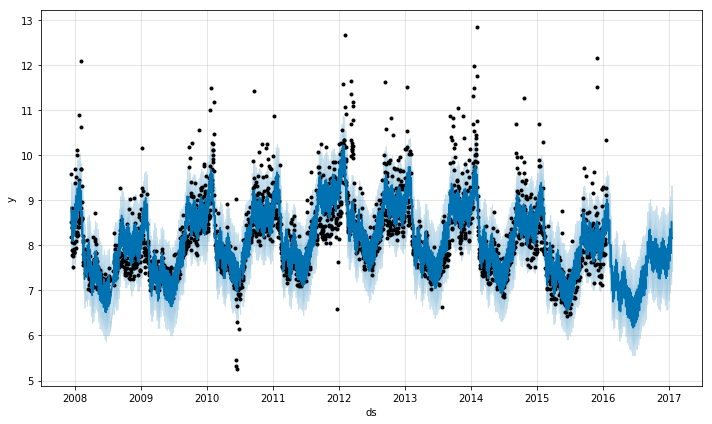

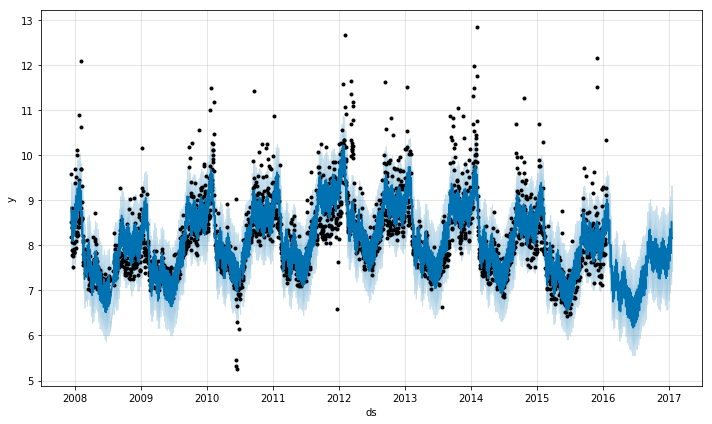

In [74]:
m.plot(forecast)

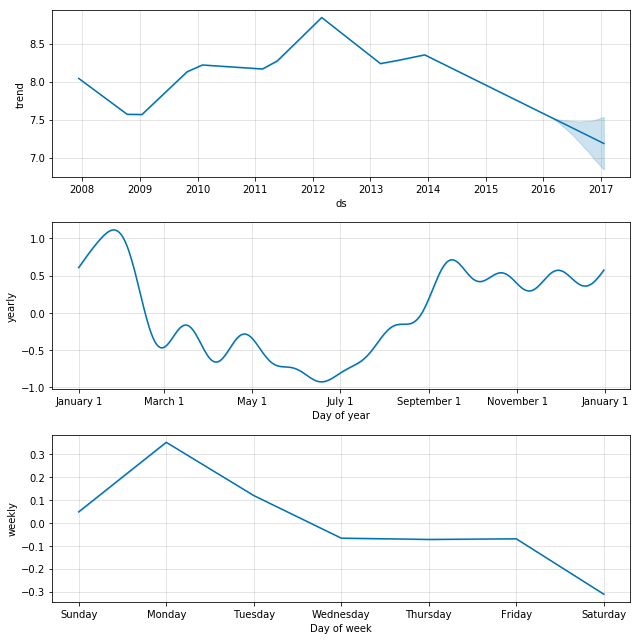

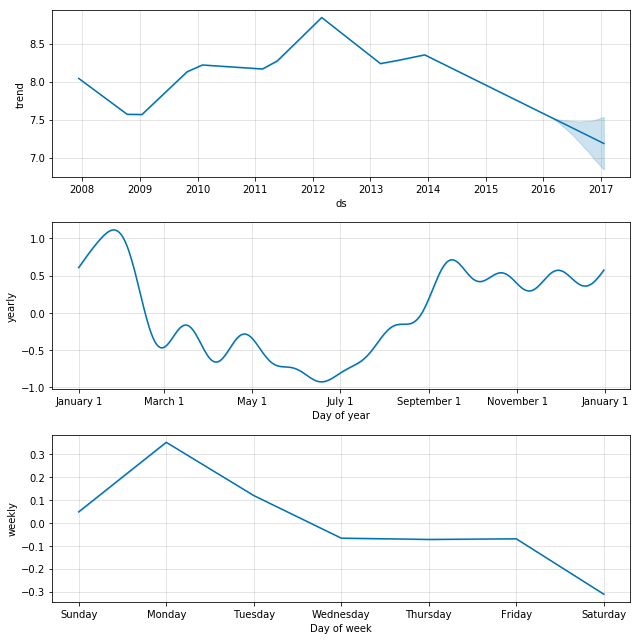

In [75]:
m.plot_components(forecast)